In [6]:
import numpy as np
import cv2 #import OpenCV
import matplotlib.pyplot as plt
from skimage.filters.rank import entropy
from skimage.morphology import disk
import fnmatch
import os

workingpath="/home/cyril/liora/projet"
normal_files="/COVID-19_Radiography_Dataset/Normal"
covid_files="/COVID-19_Radiography_Dataset/COVID"
lungOpacity_files="/COVID-19_Radiography_Dataset/Lung_Opacity"
viralPneumonia_files="/COVID-19_Radiography_Dataset/Viral Pneumonia"
size_img=299
size_small_img=50


In [7]:

# read normal images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_Normal=len(fnmatch.filter(os.listdir(workingpath+normal_files+"/images/"), "*.png"))
all_img_Normal = np.zeros((size_img, size_img, nb_files_Normal),  dtype=np.uint8)
all_img_Normal_without_mask = np.zeros((size_img, size_img, nb_files_Normal),  dtype=np.uint8)
all_small_Normal = np.zeros((size_small_img, size_small_img, nb_files_Normal),  dtype=np.uint8)
all_masks_Normal = np.zeros((size_img, size_img, nb_files_Normal),  dtype=np.uint8)
for i in range(0, nb_files_Normal):
    img_Normal = cv2.imread(workingpath+normal_files +"/images/Normal-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_Normal=cv2.equalizeHist(img_Normal)
    #configure CLAHE
    clahe = cv2.createCLAHE(clipLimit=10,tileGridSize=(8,8))
    img_Normal=clahe.apply(img_Normal)
    img_Normal_mask = cv2.imread(workingpath+normal_files +"/masks/Normal-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_Normal_mask, (img_Normal.shape[0], img_Normal.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_Normal_and_mask = cv2.bitwise_and(img_Normal,img_mask_resized)
    img_Normal_and_mask_resized = cv2.resize(img_Normal_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_Normal[:,:,i] = img_mask_resized
    all_img_Normal[:,:,i] = img_Normal_and_mask_resized
    all_small_Normal[:,:,i] = cv2.resize(img_Normal_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_Normal_without_mask[:,:,i]=img_Normal








In [8]:
# read covid images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_Covid=len(fnmatch.filter(os.listdir(workingpath+covid_files+"/images/"), "*.png"))
all_img_Covid = np.zeros((size_img, size_img, nb_files_Covid),  dtype=np.uint8)
all_small_Covid = np.zeros((size_small_img, size_small_img, nb_files_Covid),  dtype=np.uint8)
all_masks_Covid = np.zeros((size_img, size_img, nb_files_Covid),  dtype=np.uint8)
all_img_Covid_without_mask= np.zeros((size_img, size_img, nb_files_Covid),  dtype=np.uint8)
for i in range(0, nb_files_Covid):
    img_Covid = cv2.imread(workingpath+covid_files +"/images/COVID-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_Covid=cv2.equalizeHist(img_Covid)
    #configure CLAHE
    clahe = cv2.createCLAHE(clipLimit=10,tileGridSize=(8,8))
    img_Covid=clahe.apply(img_Covid)
    img_Covid_mask = cv2.imread(workingpath+covid_files +"/masks/COVID-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_Covid_mask, (img_Covid.shape[0], img_Covid.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_Covid_and_mask = cv2.bitwise_and(img_Covid,img_mask_resized)
    img_Covid_and_mask_resized = cv2.resize(img_Covid_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_Covid[:,:,i] = img_mask_resized
    all_img_Covid[:,:,i] = img_Covid_and_mask_resized
    all_small_Covid[:,:,i] = cv2.resize(img_Covid_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_Covid_without_mask[:,:,i]=img_Covid
    

In [9]:
# read lung opacity images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_LungOpacity=len(fnmatch.filter(os.listdir(workingpath+lungOpacity_files+"/images/"), "*.png"))
all_img_LungOpacity = np.zeros((size_img, size_img, nb_files_LungOpacity),  dtype=np.uint8)
all_small_LungOpacity = np.zeros((size_small_img, size_small_img, nb_files_LungOpacity),  dtype=np.uint8)
all_masks_LungOpacity = np.zeros((size_img, size_img, nb_files_LungOpacity),  dtype=np.uint8)
all_img_LungOpacity_without_mask = np.zeros((size_img, size_img, nb_files_LungOpacity),  dtype=np.uint8)
for i in range(0, nb_files_LungOpacity):
    img_LungOpacity = cv2.imread(workingpath+lungOpacity_files +"/images/Lung_Opacity-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_LungOpacity=cv2.equalizeHist(img_LungOpacity)
    #configure CLAHE
    clahe = cv2.createCLAHE(clipLimit=10,tileGridSize=(8,8))
    img_LungOpacity=clahe.apply(img_LungOpacity)
    img_LungOpacity_mask = cv2.imread(workingpath+lungOpacity_files +"/masks/Lung_Opacity-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_LungOpacity_mask, (img_LungOpacity.shape[0], img_LungOpacity.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_LungOpacity_and_mask = cv2.bitwise_and(img_LungOpacity,img_mask_resized)
    img_LungOpacity_and_mask_resized = cv2.resize(img_LungOpacity_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_LungOpacity[:,:,i] = img_mask_resized
    all_img_LungOpacity[:,:,i] = img_LungOpacity_and_mask_resized
    all_small_LungOpacity[:,:,i] = cv2.resize(img_LungOpacity_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_LungOpacity_without_mask[:,:,i]=img_LungOpacity

In [10]:
# read viral pneumonia images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_ViralPneumonia=len(fnmatch.filter(os.listdir(workingpath+viralPneumonia_files+"/images/"), "*.png"))
all_img_ViralPneumonia = np.zeros((size_img, size_img, nb_files_ViralPneumonia),  dtype=np.uint8)
all_small_ViralPneumonia = np.zeros((size_small_img, size_small_img, nb_files_ViralPneumonia),  dtype=np.uint8)
all_masks_ViralPneumonia= np.zeros((size_img, size_img, nb_files_ViralPneumonia),  dtype=np.uint8)
all_img_ViralPneumonia_without_mask = np.zeros((size_img, size_img, nb_files_ViralPneumonia),  dtype=np.uint8)
for i in range(0, nb_files_ViralPneumonia):
    img_ViralPneumonia = cv2.imread(workingpath+viralPneumonia_files +"/images/Viral Pneumonia-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_ViralPneumonia=cv2.equalizeHist(img_ViralPneumonia)
    #configure CLAHE
    clahe = cv2.createCLAHE(clipLimit=10,tileGridSize=(8,8))
    img_ViralPneumonia=clahe.apply(img_ViralPneumonia)
    img_ViralPneumonia_mask = cv2.imread(workingpath+viralPneumonia_files +"/masks/Viral Pneumonia-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_ViralPneumonia_mask, (img_ViralPneumonia.shape[0], img_ViralPneumonia.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_ViralPneumonia_and_mask = cv2.bitwise_and(img_ViralPneumonia,img_mask_resized)
    img_ViralPneumonia_and_mask_resized = cv2.resize(img_ViralPneumonia_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_ViralPneumonia[:,:,i] = img_mask_resized
    all_img_ViralPneumonia[:,:,i] = img_ViralPneumonia_and_mask_resized
    all_small_ViralPneumonia[:,:,i] = cv2.resize(img_ViralPneumonia_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_ViralPneumonia_without_mask[:,:,i]=img_ViralPneumonia

In [11]:
print('nb_files_Normal:', all_img_Normal.shape[2])
print('nb_files_Covid:', all_img_Covid.shape[2])
print('nb_files_LungOpacity:', all_img_LungOpacity.shape[2])
print('nb_files_ViralPneumonia:', all_img_ViralPneumonia.shape[2])


nb_files_Normal: 10192
nb_files_Covid: 3616
nb_files_LungOpacity: 6012
nb_files_ViralPneumonia: 1345


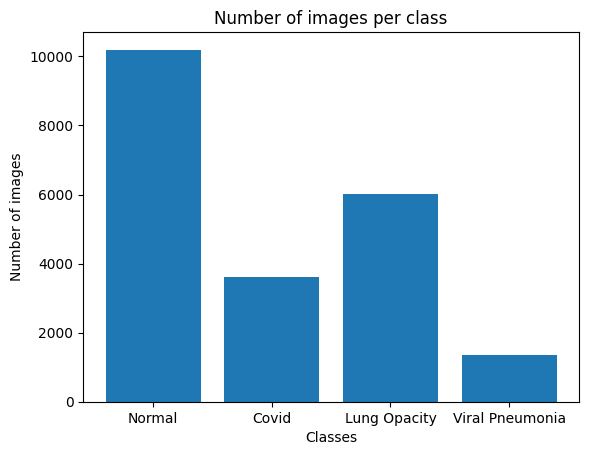

In [12]:
plt.bar([0, 1, 2, 3], [all_img_Normal.shape[2], all_img_Covid.shape[2], all_img_LungOpacity.shape[2], all_img_ViralPneumonia.shape[2]])
plt.xlabel('Classes')
plt.ylabel('Number of images')
plt.title('Number of images per class')
plt.xticks([0, 1, 2, 3], ['Normal', 'Covid', 'Lung Opacity', 'Viral Pneumonia'])
plt.show()

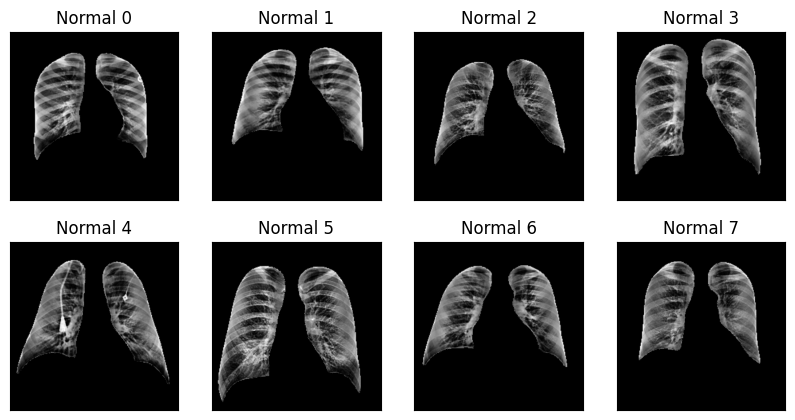

In [13]:

rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5))

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("Normal "+str(i))
    

Text(0.5, 1.0, 'mean of all normal images')

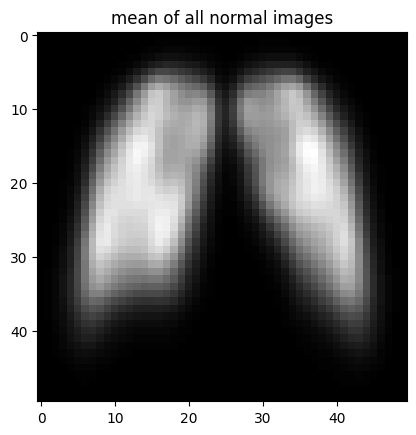

In [14]:
normalmean=np.mean(all_small_Normal, axis=2).astype("uint8")
plt.imshow(normalmean, cmap='gray');
plt.title("mean of all normal images")

Text(0.5, 1.0, 'median of all normal images')

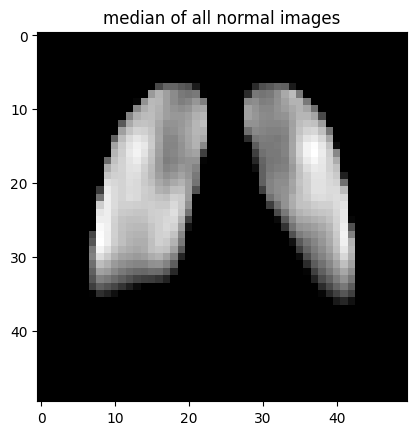

In [15]:
normalmedian=np.median(all_small_Normal, axis=2).astype("uint8")
plt.imshow(normalmedian, cmap='gray');
plt.title("median of all normal images")


In [16]:
def mse(imageA, imageB):
   
    assert imageA.shape == imageB.shape, "Images must be the same size."
  
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])

    return err


all_normal_mse=[]
for i in range(0, nb_files_Normal):
    
    diff= mse(normalmean, all_small_Normal[:,:,i])
    all_normal_mse.append(diff)



Text(0.5, 1.0, 'mse between each normal image and the mean of all normal images')

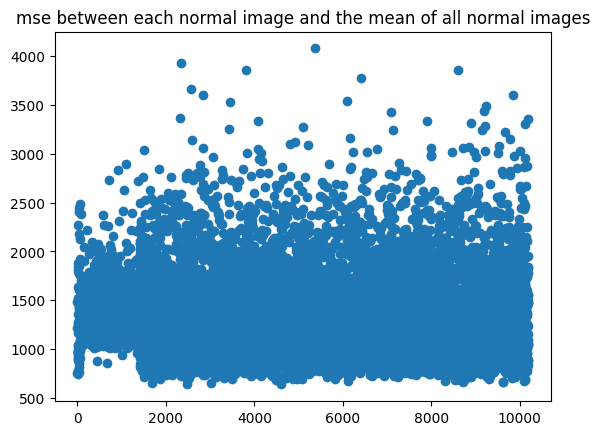

In [17]:
#print(len(all_normal_mse))
plt.scatter(range(0, len(all_normal_mse)), all_normal_mse)
plt.title("mse between each normal image and the mean of all normal images")

In [18]:
all_normal_mse_arr = np.array(all_normal_mse)
values_outliers_normal=np.where(all_normal_mse_arr > 2500)[0]
print("indices éloignés:",values_outliers_normal)





indices éloignés: [  705   918  1050  1095  1373  1477  1506  1524  1630  1659  1731  1840
  1882  2050  2075  2106  2210  2263  2316  2332  2334  2446  2464  2508
  2576  2599  2616  2708  2764  2776  2786  2828  2844  2847  2855  2860
  2945  2959  3068  3093  3095  3152  3257  3270  3280  3411  3417  3422
  3459  3468  3585  3613  3662  3736  3803  3831  3915  3983  4076  4091
  4105  4123  4159  4175  4240  4310  4452  4486  4503  4553  4615  4650
  4768  4795  4808  4910  4923  4994  5078  5104  5138  5200  5202  5367
  5479  5521  5536  5580  5615  5646  5686  5767  5819  5838  5986  6011
  6089  6165  6169  6194  6238  6385  6409  6410  6423  6473  6515  6528
  6546  6548  6650  6777  6816  6833  6861  6923  7033  7078  7079  7085
  7134  7172  7211  7260  7316  7328  7408  7423  7451  7530  7661  7701
  7708  7746  7748  7770  7806  7826  7829  7905  7962  7992  7994  8003
  8063  8168  8457  8593  8612  8661  8668  8713  8759  8763  8815  8821
  8834  8854  8904  8917  8956  8

In [19]:

values_proche_normal=np.where(all_normal_mse_arr<370)[0]
print("indices proche :",values_proche_normal)


indices proche : []


/tmp/ipykernel_31056/3012774764.py:16: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


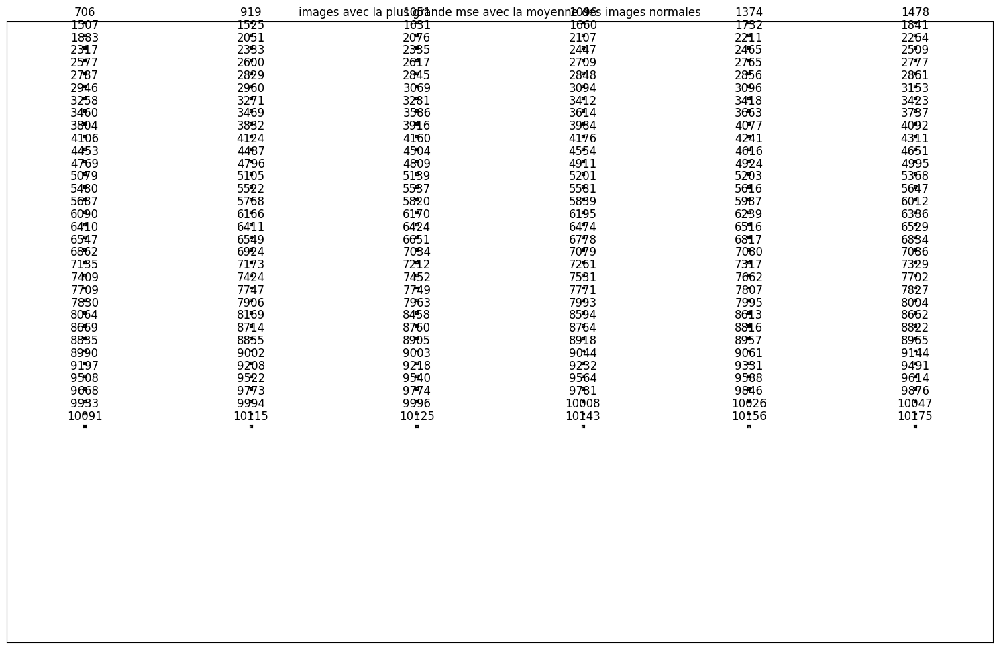

In [20]:
fig =  plt.figure(figsize = (15,10))
plt.title("images avec la plus grande mse avec la moyenne des images normales")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_normal)//4+1
j=1
plt.tight_layout()

for i in values_outliers_normal :
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1




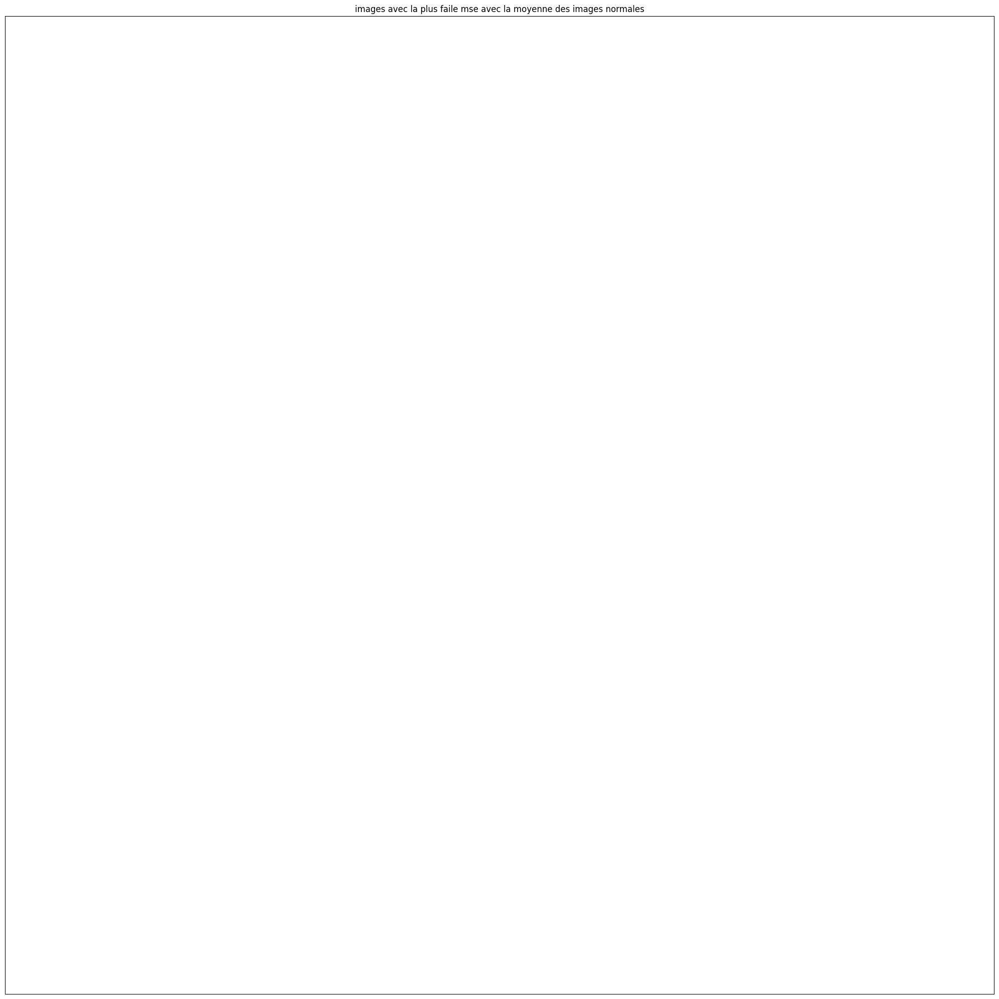

In [21]:
fig =  plt.figure(figsize = (20,20))
plt.title("images avec la plus faile mse avec la moyenne des images normales")
plt.xticks([]);
plt.yticks([]);
columns = 6
plt.tight_layout()
rows = len(values_proche_normal)//4+1
j=1

for i in values_proche_normal :
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1


In [22]:
####### FIN NORMAL et DEBUT COVID ########

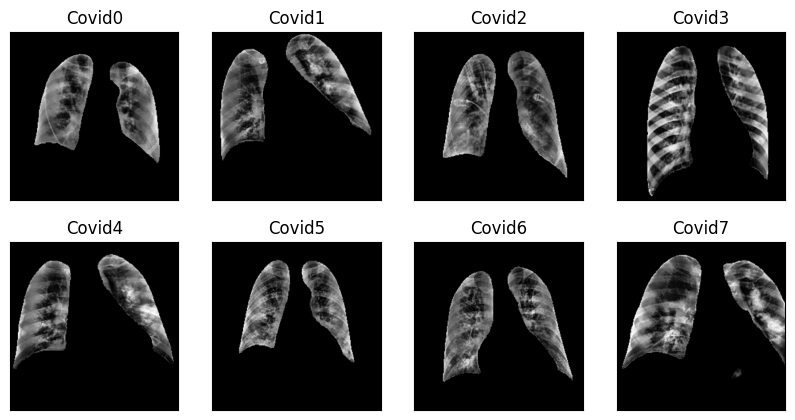

In [23]:
rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5))

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("Covid"+str(i))

Text(0.5, 1.0, 'mean of all covid images')

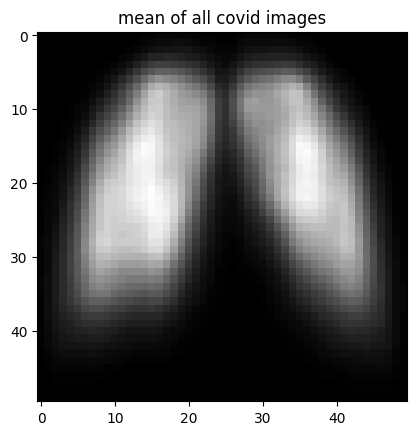

In [24]:
covidmean=np.mean(all_small_Covid, axis=2).astype("uint8")
plt.imshow(covidmean, cmap='gray');
plt.title("mean of all covid images")

Text(0.5, 1.0, 'median of all covid images')

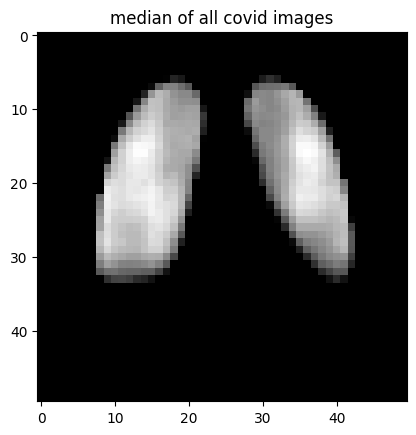

In [25]:
covidmedian=np.median(all_small_Covid, axis=2).astype("uint8")
plt.imshow(covidmedian, cmap='gray');
plt.title("median of all covid images")

In [26]:
all_covid_mse=[]
for i in range(0, nb_files_Covid):
    
    diff= mse(covidmean, all_small_Covid[:,:,i])
    all_covid_mse.append(diff)

1163.7496


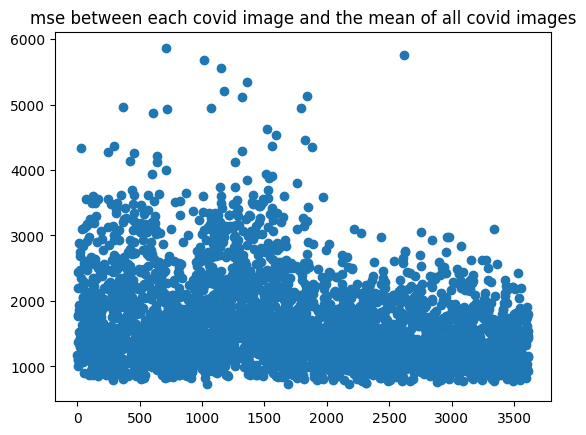

In [27]:
plt.scatter(range(0, len(all_covid_mse)), all_covid_mse)
plt.title("mse between each covid image and the mean of all covid images")

print(all_covid_mse[3615])

In [28]:
all_covid_mse_arr = np.array(all_covid_mse)
mask = all_covid_mse_arr > 4000
values_outliers_covid=np.where(mask)[0]
print("indices:",values_outliers_covid)



indices: [  25  243  296  368  421  451  606  635  638  711  716 1016 1075 1155
 1178 1267 1316 1320 1356 1522 1561 1595 1789 1826 1842 1880 2617]


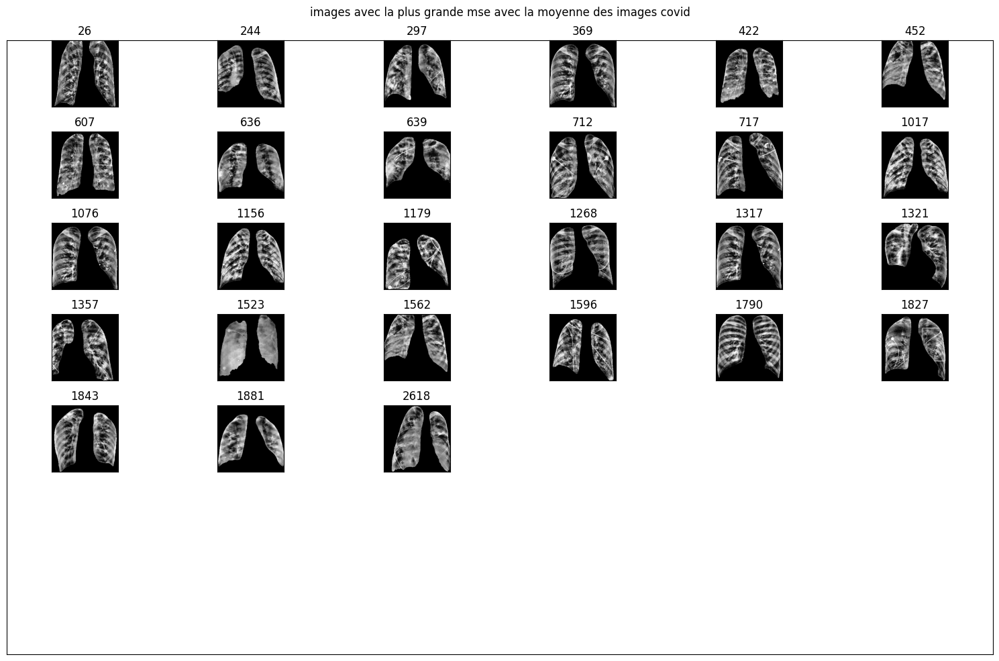

In [29]:
fig =  plt.figure(figsize = (15,10))
plt.suptitle("images avec la plus grande mse avec la moyenne des images covid")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_covid)//4+1
j=1

for i in values_outliers_covid:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

In [30]:
##### FIN COVID et DEBUT LUNG OPACITY ####

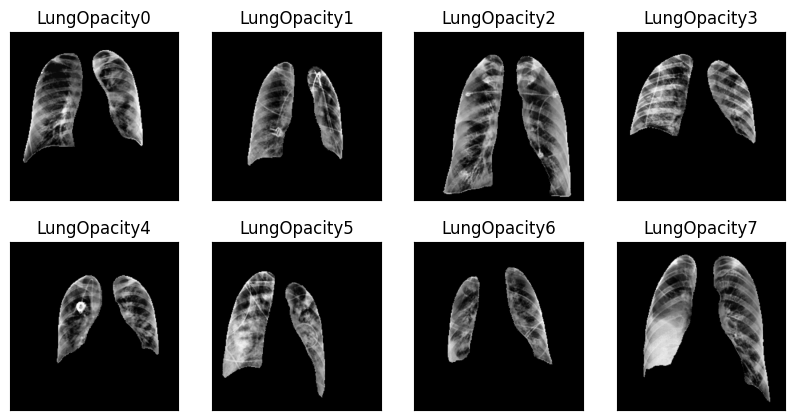

In [31]:
rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5))

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("LungOpacity"+str(i))


Text(0.5, 1.0, 'mean of all lung opacity images')

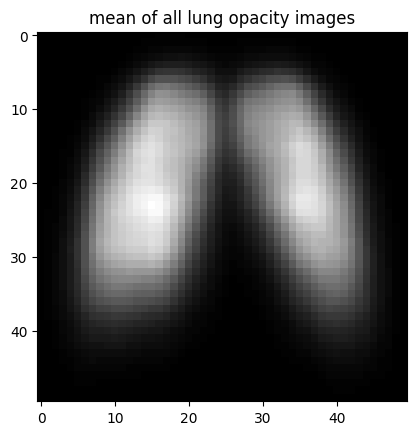

In [32]:
lungOpacitymean=np.mean(all_small_LungOpacity, axis=2).astype("uint8")
plt.imshow(lungOpacitymean, cmap='gray');
plt.title("mean of all lung opacity images")

Text(0.5, 1.0, 'median of all lung opacity images')

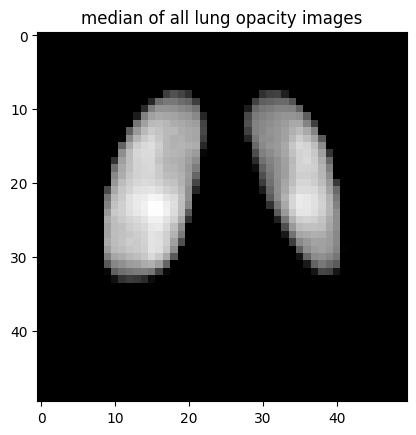

In [33]:
lungOpacitymedian=np.median(all_small_LungOpacity, axis=2).astype("uint8")
plt.imshow(lungOpacitymedian, cmap='gray');
plt.title("median of all lung opacity images")

In [34]:
all_lungOpacity_mse=[]
for i in range(0, nb_files_LungOpacity):
    
    diff= mse(lungOpacitymean, all_small_LungOpacity[:,:,i])
    all_lungOpacity_mse.append(diff)

Text(0.5, 1.0, 'mse between each lung opacity image and the mean of all lung opacity images')

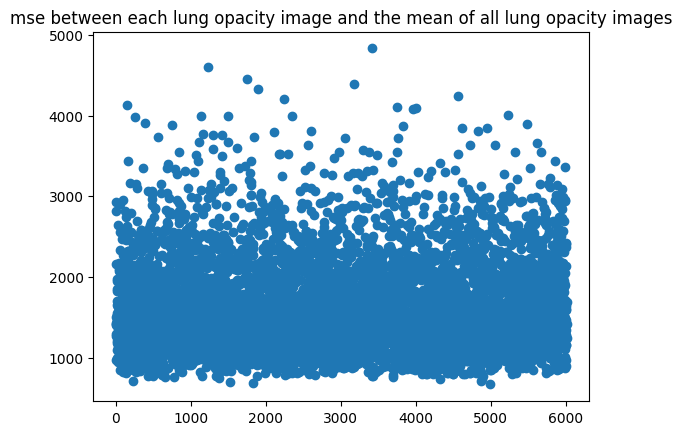

In [35]:
plt.scatter(range(0, len(all_lungOpacity_mse)), all_lungOpacity_mse)
plt.title("mse between each lung opacity image and the mean of all lung opacity images")

In [38]:
all_lungOpacity_mse_arr = np.array(all_lungOpacity_mse)
mask = all_lungOpacity_mse_arr > 4000
values_outliers_lungOpacity=np.where(mask)[0]
print("indices:",values_outliers_lungOpacity)

indices: [ 143 1230 1752 1900 2242 3176 3415 3749 3965 4003 4561 5225]


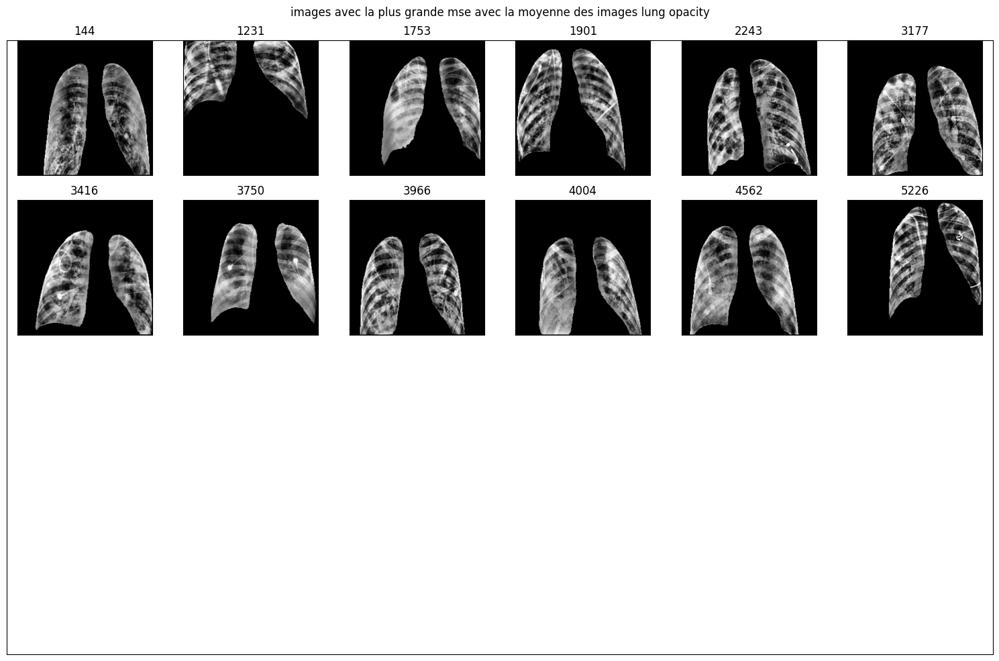

In [40]:
fig =  plt.figure(figsize = (15,10))
plt.suptitle("images avec la plus grande mse avec la moyenne des images lung opacity")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_lungOpacity)//4+1
j=1

for i in values_outliers_lungOpacity:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

In [41]:
##### fin lung opacity et debut viral pneumonia ####

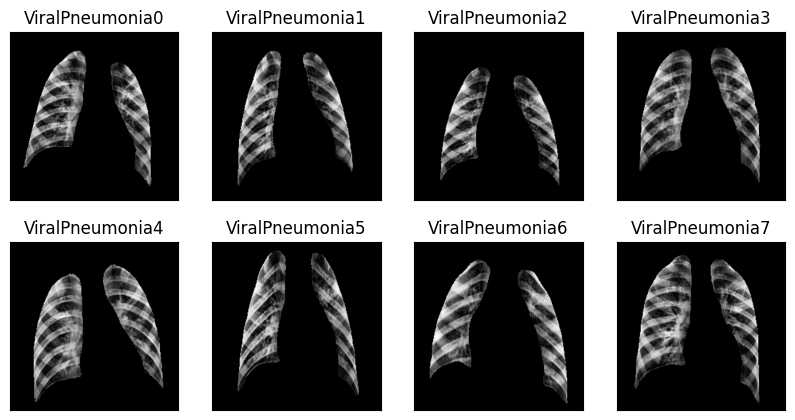

In [42]:
rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5));

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("ViralPneumonia"+str(i));

Text(0.5, 1.0, 'mean of all viral pneumonia images')

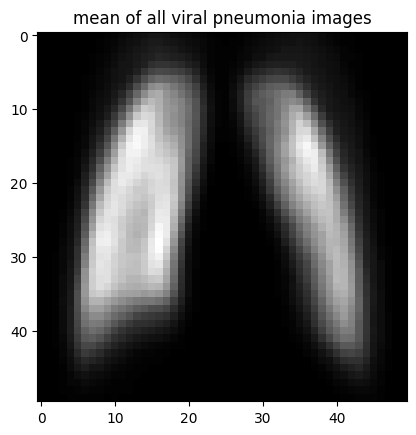

In [43]:
ViralPneumoniamean=np.mean(all_small_ViralPneumonia, axis=2).astype("uint8")
plt.imshow(ViralPneumoniamean, cmap='gray');
plt.title("mean of all viral pneumonia images")

Text(0.5, 1.0, 'median of all viral pneumonia images')

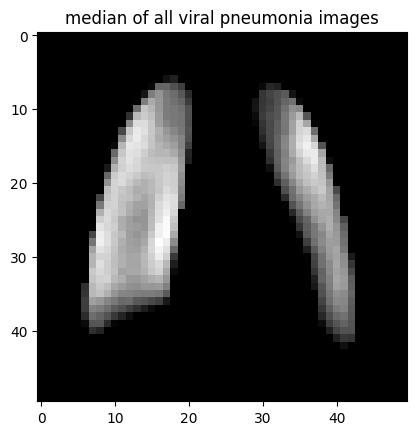

In [44]:
ViralPneumoniamedian=np.median(all_small_ViralPneumonia, axis=2).astype("uint8")
plt.imshow(ViralPneumoniamedian, cmap='gray');
plt.title("median of all viral pneumonia images")

In [45]:
all_ViralPneumonia_mse=[]
for i in range(0, nb_files_ViralPneumonia):
    
    diff= mse(ViralPneumoniamean, all_small_ViralPneumonia[:,:,i])
    all_ViralPneumonia_mse.append(diff)

Text(0.5, 1.0, 'mse between each viral pneumonia image and the mean of all viral pneumonia images')

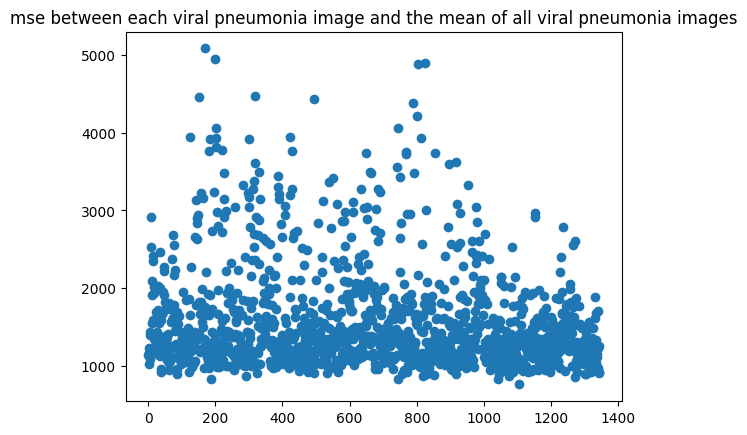

In [46]:
plt.scatter(range(0, len(all_ViralPneumonia_mse)), all_ViralPneumonia_mse)
plt.title("mse between each viral pneumonia image and the mean of all viral pneumonia images")

In [69]:
all_ViralPneumonia_mse_arr = np.array(all_ViralPneumonia_mse)
mask = all_ViralPneumonia_mse_arr > 3500
values_outliers_ViralPneumonia=np.where(mask)[0]
print("indices:",values_outliers_ViralPneumonia)

indices: [125 150 169 180 183 200 201 202 203 221 299 318 319 421 428 494 650 741
 744 767 769 789 802 805 814 825 855 897 917]


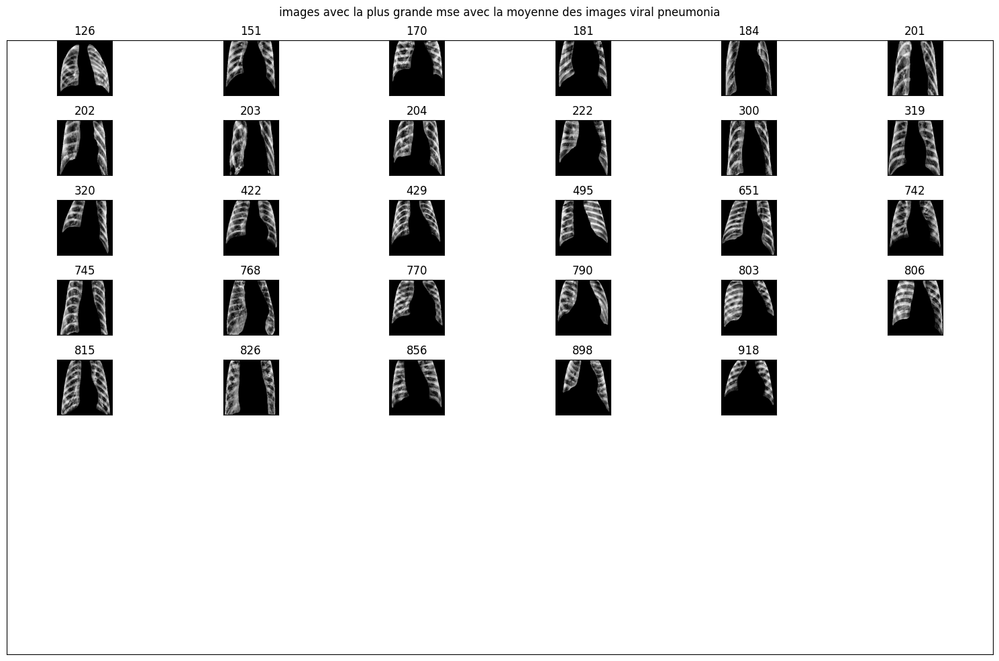

In [70]:
fig =  plt.figure(figsize = (15,10))
plt.suptitle("images avec la plus grande mse avec la moyenne des images viral pneumonia")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_ViralPneumonia)//4+1
j=1

for i in values_outliers_ViralPneumonia:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

In [71]:
# analyse avec traitement d'images

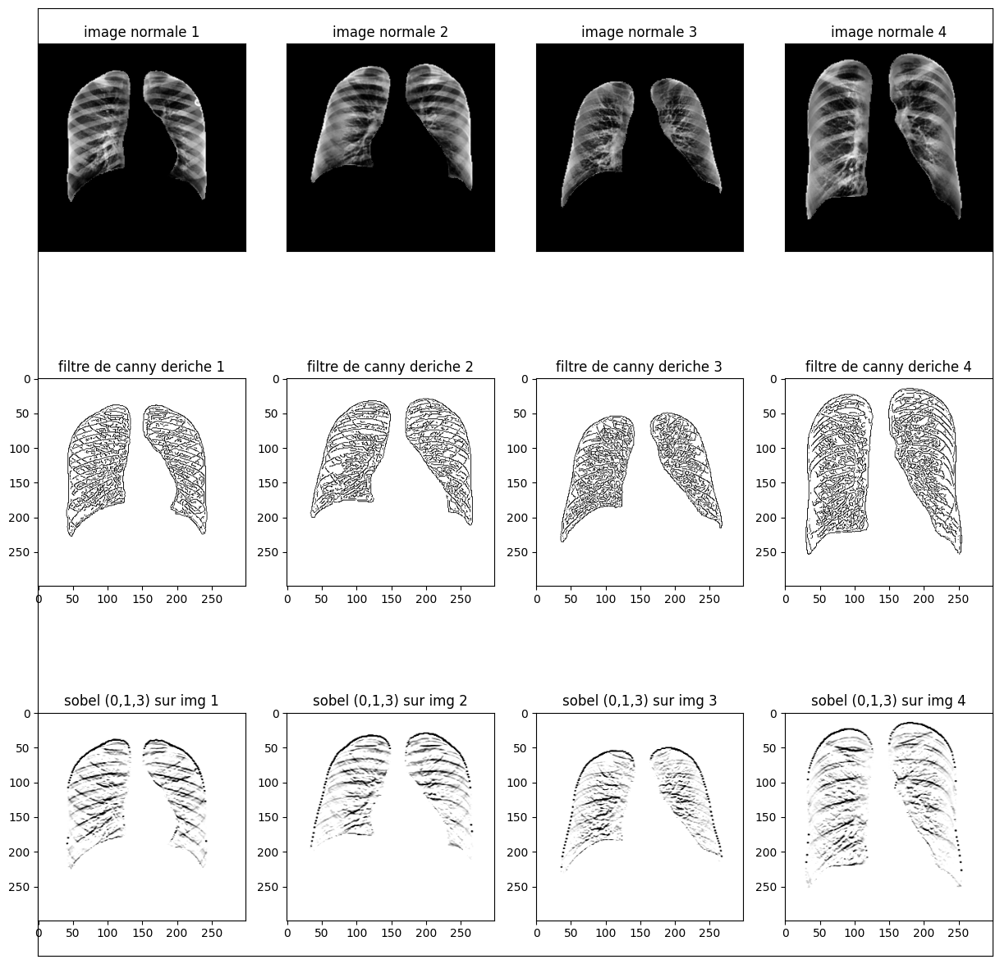

In [72]:

fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_Normal[:,:,i],50,100)
    img_mask_edges = cv2.Canny(all_masks_Normal[:,:,i],50,100)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.title("image normale " + str(i+1))
    plt.xticks([]);
    plt.yticks([]);
    
    fig.add_subplot(rows, columns, i+5)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_Normal[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

    

    

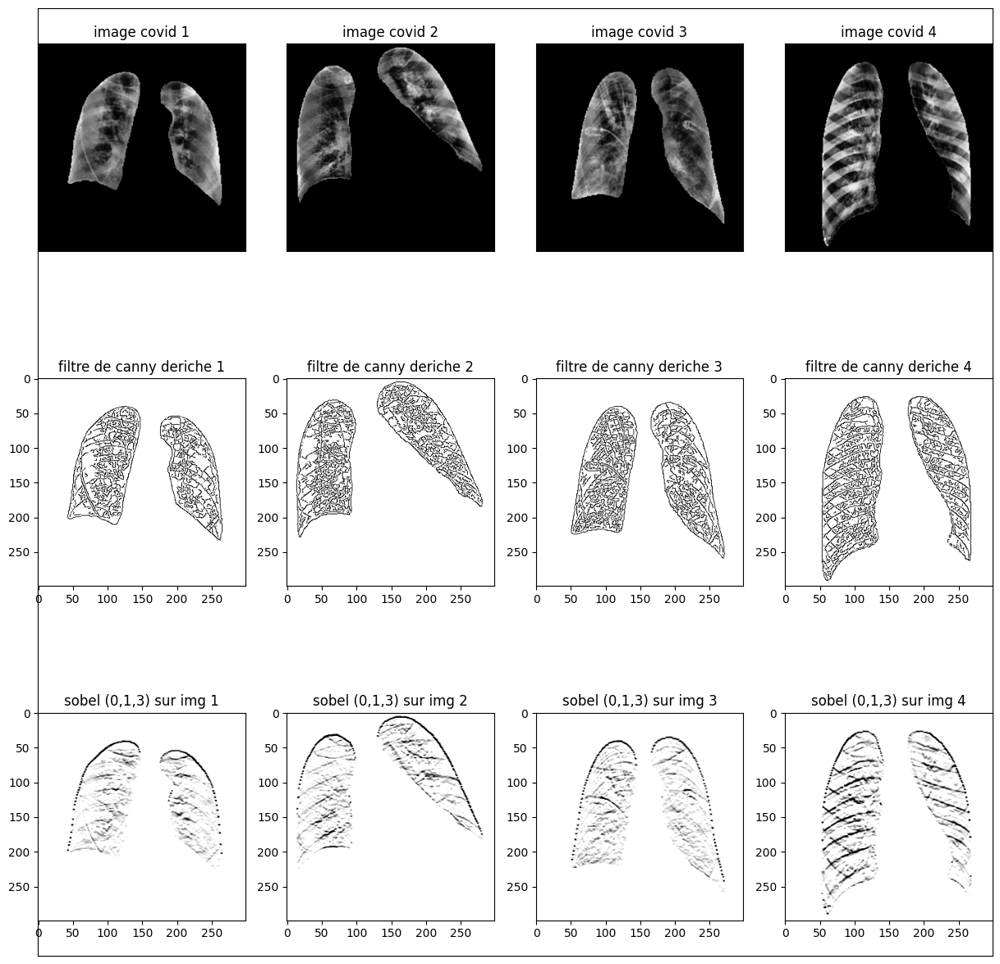

In [73]:
fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_Covid[:,:,i],50,100)
    img_mask_edges = cv2.Canny(all_masks_Covid[:,:,i],50,100)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.title("image covid " + str(i+1))
    plt.xticks([]);
    plt.yticks([]);
    fig.add_subplot(rows, columns, i+5)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_Covid[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

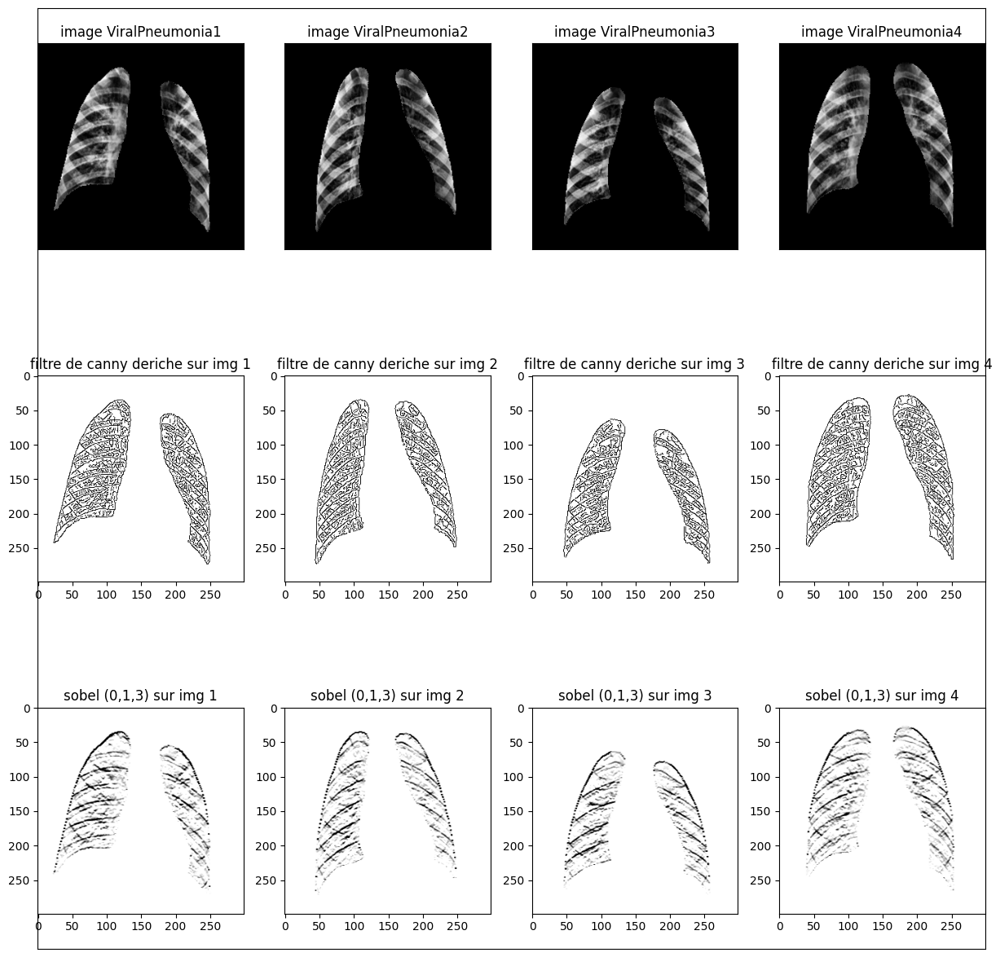

In [74]:
fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_ViralPneumonia[:,:,i],50,100)
    img_mask_edges = cv2.Canny(all_masks_ViralPneumonia[:,:,i],50,100)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.title("image ViralPneumonia" + str(i+1))
    plt.xticks([]);
    plt.yticks([]);
    fig.add_subplot(rows, columns, i+5)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche sur img " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_ViralPneumonia[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

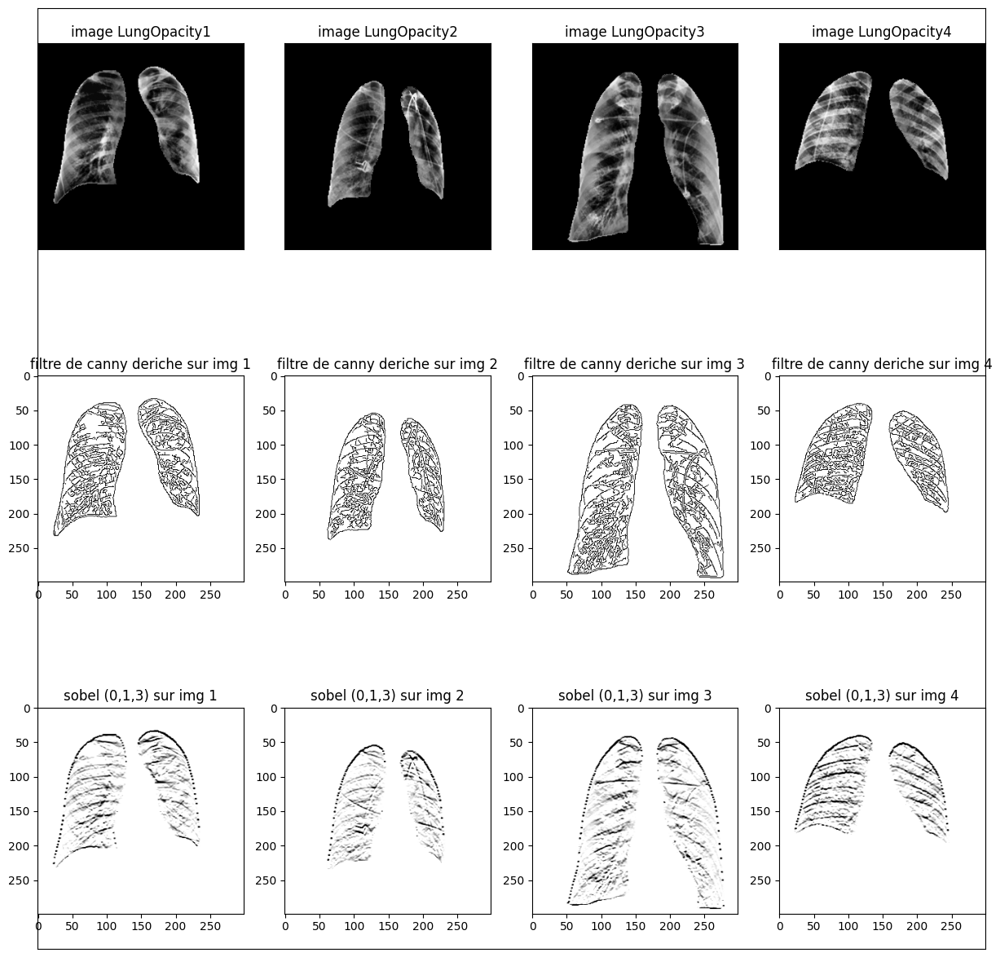

In [75]:
fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_LungOpacity[:,:,i],50,200)
    img_mask_edges = cv2.Canny(all_masks_LungOpacity[:,:,i],50,200)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    img_edges_minus_masks_blur = cv2.GaussianBlur(img_edges_minus_masks,(9,9),3,4)
    img_test = cv2.bitwise_and(all_img_LungOpacity[:,:,i],img_edges_minus_masks_blur)

    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.title("image LungOpacity" + str(i+1))
    plt.xticks([]);
    plt.yticks([]);

    fig.add_subplot(rows, columns, i+1+columns)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche sur img " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_LungOpacity[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

In [76]:
# detection des images floues Normal

variance_laplacien_Normal=[]
for i in range(0, nb_files_Normal):

    variance_laplacien_Normal.append(cv2.Laplacian(all_img_Normal_without_mask[:,:,i], cv2.CV_64F).var())

    # detection des images floues Covid

variance_laplacien_Covid=[]
for i in range(0, nb_files_Covid):

    variance_laplacien_Covid.append(cv2.Laplacian(all_img_Covid_without_mask[:,:,i], cv2.CV_64F).var())


# detection des images floues Lung Opacity

variance_laplacien_LungOpacity=[]
for i in range(0, nb_files_LungOpacity):

    variance_laplacien_LungOpacity.append(cv2.Laplacian(all_img_LungOpacity_without_mask[:,:,i], cv2.CV_64F).var())


# detection des images floues Viral Pneumo

variance_laplacien_ViralPneumonia=[]
for i in range(0, nb_files_ViralPneumonia):

    variance_laplacien_ViralPneumonia.append(cv2.Laplacian(all_img_ViralPneumonia_without_mask[:,:,i], cv2.CV_64F).var())



Text(0.5, 1.0, 'variance laplacien Viral Pneumonia = flou ')

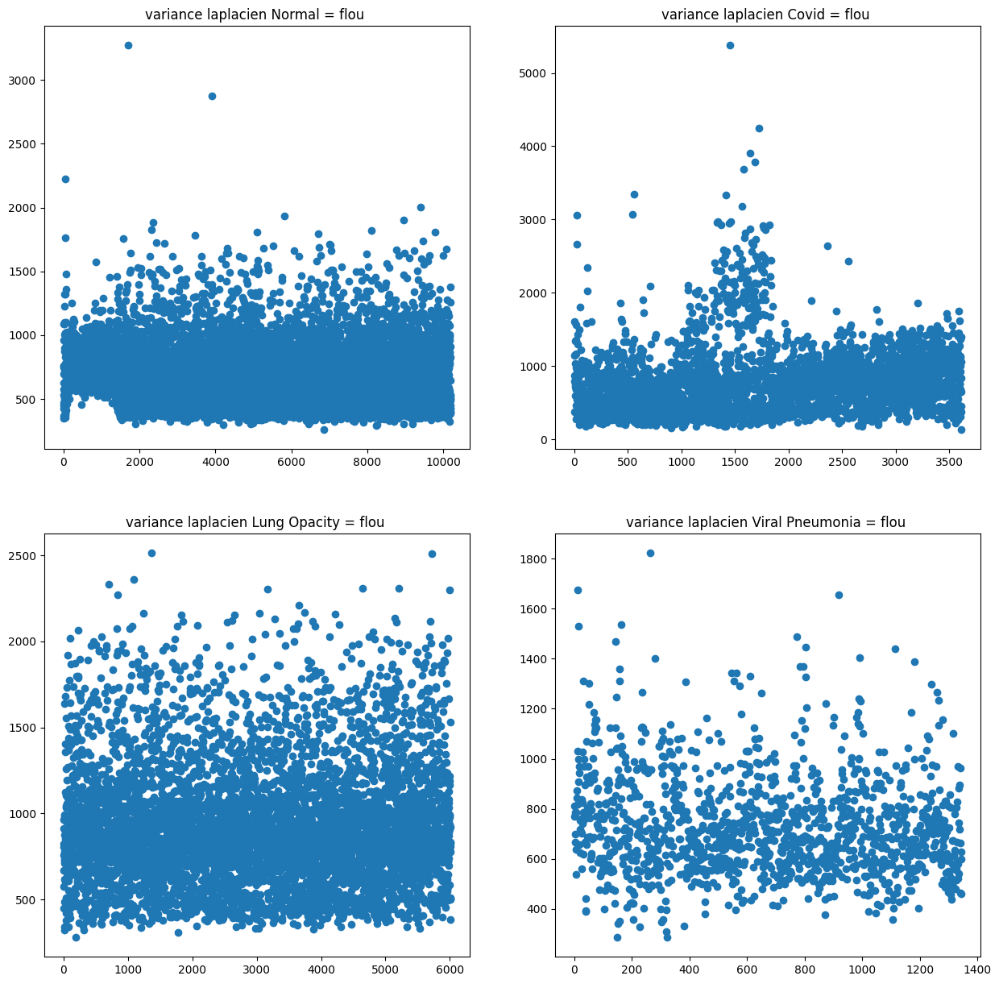

In [120]:
fig =  plt.figure(figsize = (15,15)) 
plt.subplot(2,2,1)
plt.scatter(range(0, nb_files_Normal),variance_laplacien_Normal)
plt.title("variance laplacien Normal = flou ")
plt.subplot(2,2,2)
plt.scatter(range(0, nb_files_Covid),variance_laplacien_Covid)
plt.title("variance laplacien Covid = flou ")
plt.subplot(2,2,3)
plt.scatter(range(0, nb_files_LungOpacity),variance_laplacien_LungOpacity)
plt.title("variance laplacien Lung Opacity = flou ")
plt.subplot(2,2,4)
plt.scatter(range(0, nb_files_ViralPneumonia),variance_laplacien_ViralPneumonia)
plt.title("variance laplacien Viral Pneumonia = flou ")

In [126]:
variance_laplacien_normal_arr = np.array(variance_laplacien_Normal)
maskNormal = variance_laplacien_normal_arr < 340
outliers_variance_laplacien_normal=np.where(maskNormal)[0]
print("indices flous cas normaux :",outliers_variance_laplacien_normal+1)

variance_laplacien_Covid_arr = np.array(variance_laplacien_Covid)
maskCovid = variance_laplacien_Covid_arr < 200
outliers_variance_laplacien_Covid=np.where(maskCovid)[0]
print("indices flous cas covid :",outliers_variance_laplacien_Covid+1)

variance_laplacien_LungOpacity_arr = np.array(variance_laplacien_LungOpacity)
maskLungOpacity = variance_laplacien_LungOpacity_arr < 370
outliers_variance_laplacien_LungOpacity=np.where(maskLungOpacity)[0]
print("indices flous cas Lung Opacity :",outliers_variance_laplacien_LungOpacity+1)

variance_laplacien_ViralPneumonia_arr = np.array(variance_laplacien_ViralPneumonia)
maskViralPneumonia = variance_laplacien_ViralPneumonia_arr < 400
outliers_variance_laplacien_ViralPneumonia=np.where(maskViralPneumonia)[0]
print("indices flous cas Viral Pneumonia:",outliers_variance_laplacien_ViralPneumonia+1)

indices flous cas normaux : [ 1530  1899  2075  2808  3172  3244  3268  3790  3906  4084  4206  4603
  4604  4815  4925  4927  4999  5131  5196  5231  5792  6392  6462  6485
  6521  6616  6839  6855  7129  7619  7667  7887  8235  8266  8566  8694
  8964  9195  9682 10114 10168]
indices flous cas covid : [  46  104  475  630  761  855  877  901 1013 1022 1141 1341 1401 1404
 1413 1553 2647 2687 2688 2838 3615]
indices flous cas Lung Opacity : [  12   16   84  191  235  306  311  456  583  588  771  968 1014 1198
 1329 1785 2066 2686 2769 2985 3030 3083 3260 3570 3630 3783 3876 3888
 3988 4252 4303 4464 4872 5008 5332 5511 5530 5686]
indices flous cas Viral Pneumonia: [  39   41  106  150  151  158  205  227  300  302  309  319  320  323
  382  455  562  872 1022 1047 1106]


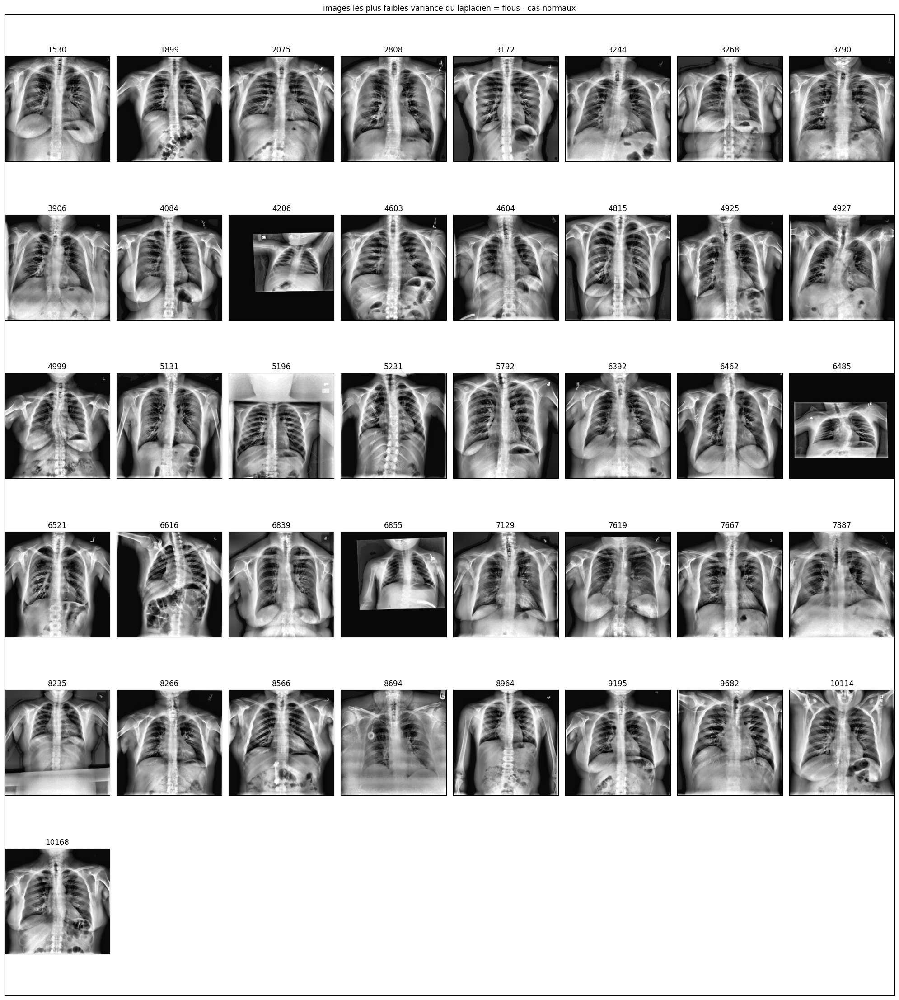

In [127]:

fig =  plt.figure(figsize = (20,22))

#  normal
plt.title("images les plus faibles variance du laplacien = flous - cas normaux")
plt.xticks([]);
plt.yticks([]);
columns = 8
rows = np.ceil(len(outliers_variance_laplacien_normal)//columns+1)
j=1

for i in outliers_variance_laplacien_normal:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1





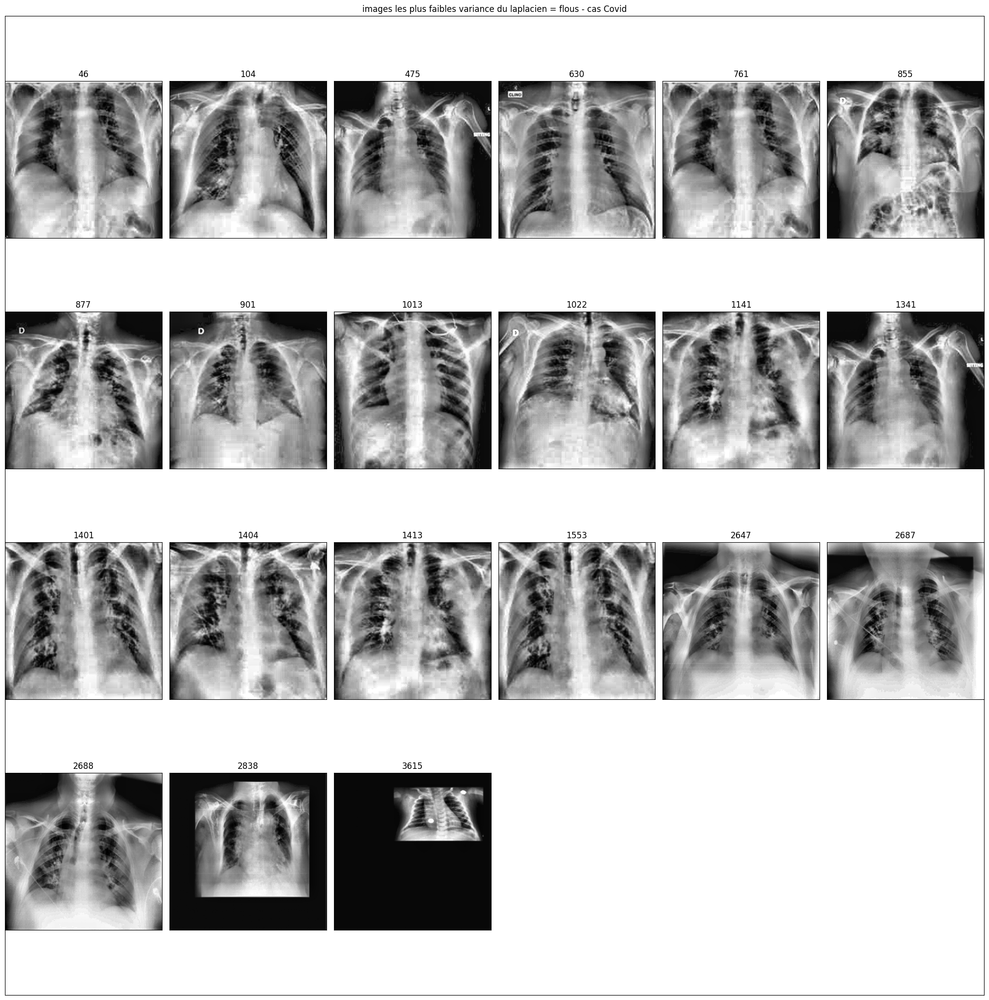

In [128]:
#  covid
fig =  plt.figure(figsize = (20,20))
plt.title("images les plus faibles variance du laplacien = flous - cas Covid")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = np.ceil(len(outliers_variance_laplacien_Covid)//columns+1)
j=1

for i in outliers_variance_laplacien_Covid:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

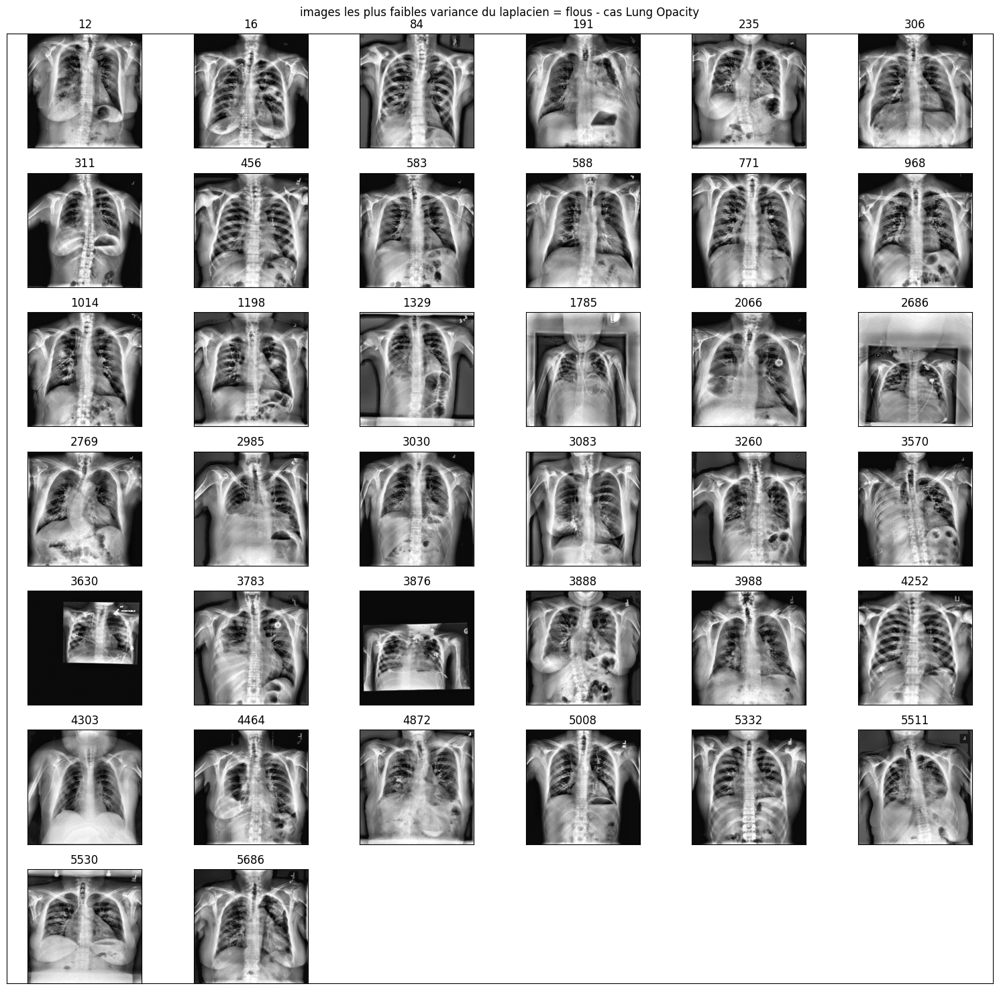

In [129]:
# LungOpacity
fig =  plt.figure(figsize = (15,15))
plt.suptitle("images les plus faibles variance du laplacien = flous - cas Lung Opacity")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = np.ceil(len(outliers_variance_laplacien_LungOpacity)//columns+1)
j=1

for i in outliers_variance_laplacien_LungOpacity:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

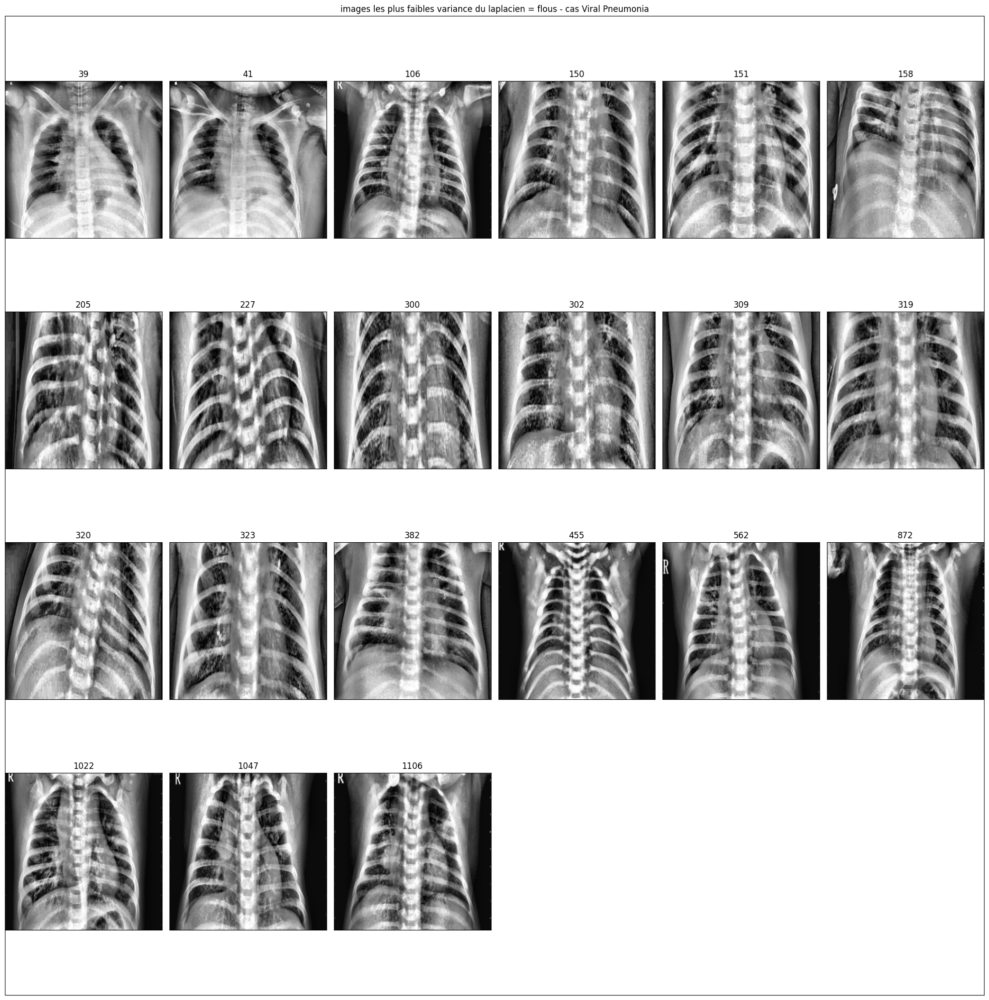

In [130]:
# Viral Pneumonia
fig =  plt.figure(figsize = (20,20))
plt.title("images les plus faibles variance du laplacien = flous - cas Viral Pneumonia")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = np.ceil(len(outliers_variance_laplacien_ViralPneumonia)//columns+1)
j=1

for i in outliers_variance_laplacien_ViralPneumonia:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[4212, 4205, 2000, 2880, 1939, 8315, 9056, 1536, 8052, 7490, 1571, 8140, 1881, 4802, 6854, 8176, 4882, 5045, 8992, 2094]


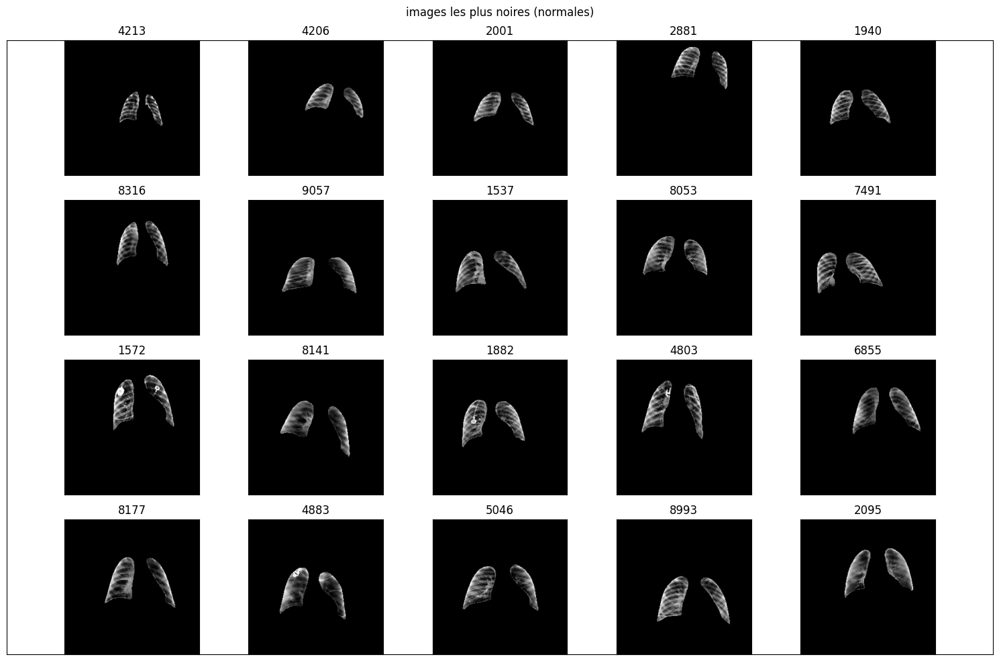

In [131]:
# detection des images ou il y a beaucoup de noir (normales)

fig =  plt.figure(figsize = (15,10))
plt.suptitle("images les plus noires (normales)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_Normal=[]
for i in range(0, nb_files_Normal):
    
    black_Normal.append(sum(sum(all_img_Normal[:,:,i]<5)))

black_Normal_ids=np.argsort(black_Normal)[-20:][::-1].tolist()

print(black_Normal_ids)
j=1

for i in black_Normal_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1


[3614, 3200, 480, 2061, 2402, 1080, 2835, 476, 2415, 2417, 484, 2556, 310, 1674, 3075, 2063, 2557, 2837, 555, 527]


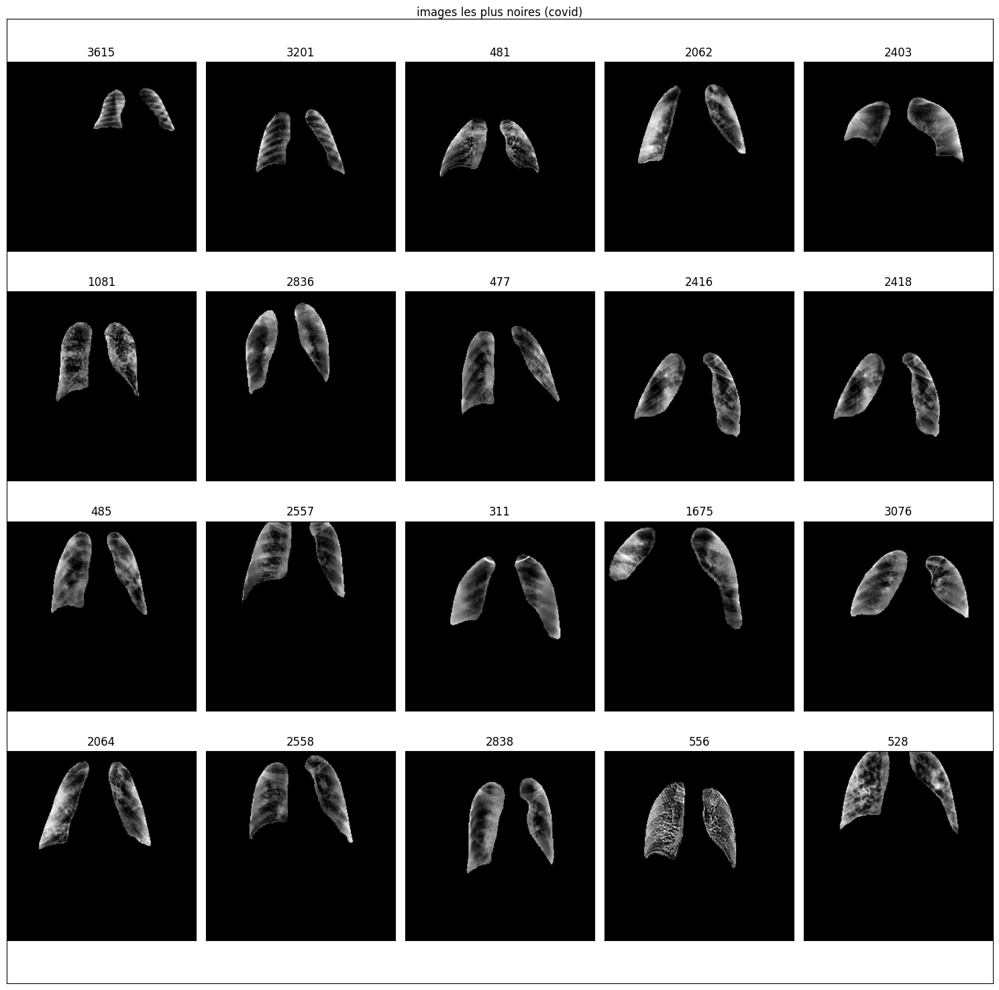

In [132]:
# detection des images ou il y a beaucoup de noir (covid)

fig =  plt.figure(figsize = (15,15))
plt.suptitle("images les plus noires (covid)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_Covid=[]
for i in range(0, nb_files_Covid):
    
    black_Covid.append(sum(sum(all_img_Covid[:,:,i]<5)))

black_Covid_ids=np.argsort(black_Covid)[-20:][::-1].tolist()

print(black_Covid_ids)
j=1

for i in black_Covid_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))  
    plt.tight_layout() 
    j=j+1

[4290, 3335, 148, 5091, 827, 4530, 3061, 6004, 1251, 1755, 3388, 4716, 2282, 4608, 1993, 548, 878, 1784, 3885, 2421]


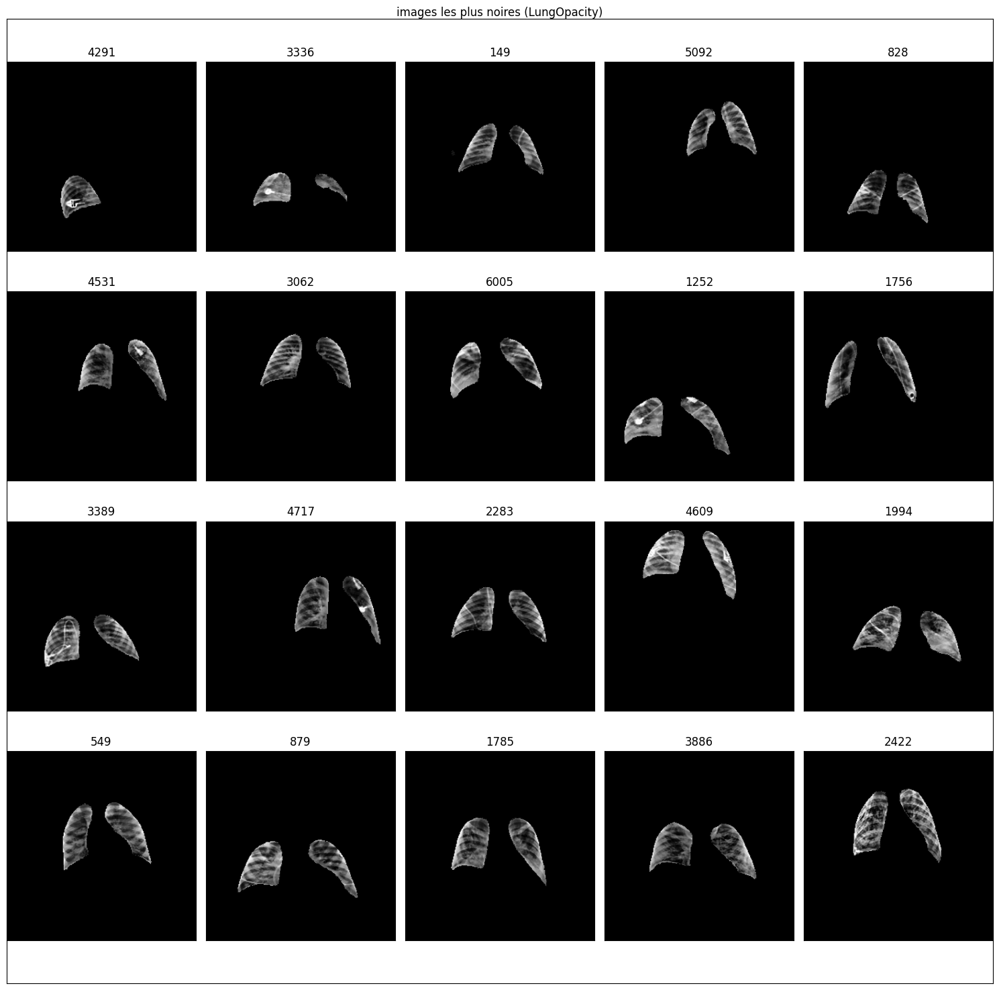

In [133]:
# detection des images ou il y a beaucoup de noir (LungOpacity)

fig =  plt.figure(figsize = (15,15))
plt.suptitle("images les plus noires (LungOpacity)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_LungOpacity=[]
for i in range(0, nb_files_LungOpacity):
    
    black_LungOpacity.append(sum(sum(all_img_LungOpacity[:,:,i]<5)))

black_LungOpacity_ids=np.argsort(black_LungOpacity)[-20:][::-1].tolist()

print(black_LungOpacity_ids)
j=1

for i in black_LungOpacity_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[1196, 596, 454, 1011, 1173, 1166, 136, 900, 1213, 812, 337, 926, 379, 1197, 594, 595, 508, 870, 829, 1155]


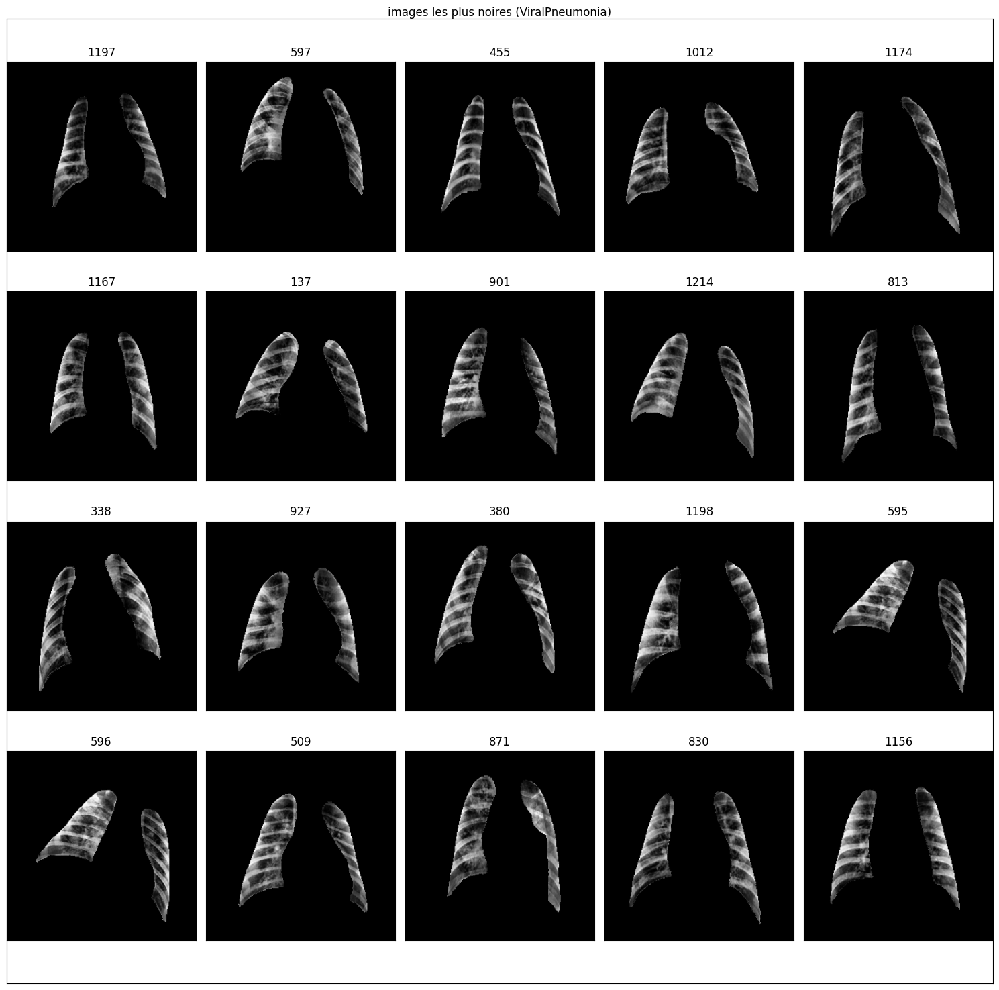

In [134]:
# detection des images ou il y a beaucoup de noir (ViralPneumonia)

fig =  plt.figure(figsize = (15,15))
plt.suptitle("images les plus noires (ViralPneumonia)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_ViralPneumonia=[]
for i in range(0, nb_files_ViralPneumonia):
    
    black_ViralPneumonia.append(sum(sum(all_img_ViralPneumonia[:,:,i]<5)))

black_ViralPneumonia_ids=np.argsort(black_ViralPneumonia)[-20:][::-1].tolist()


print(black_ViralPneumonia_ids)
j=1

for i in black_ViralPneumonia_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[8593, 7770, 9231, 6081, 1546, 1932, 6710, 9217, 8714, 9546, 5280, 9539, 6812, 1455, 4665, 2776, 1815, 9626, 8029, 5389]


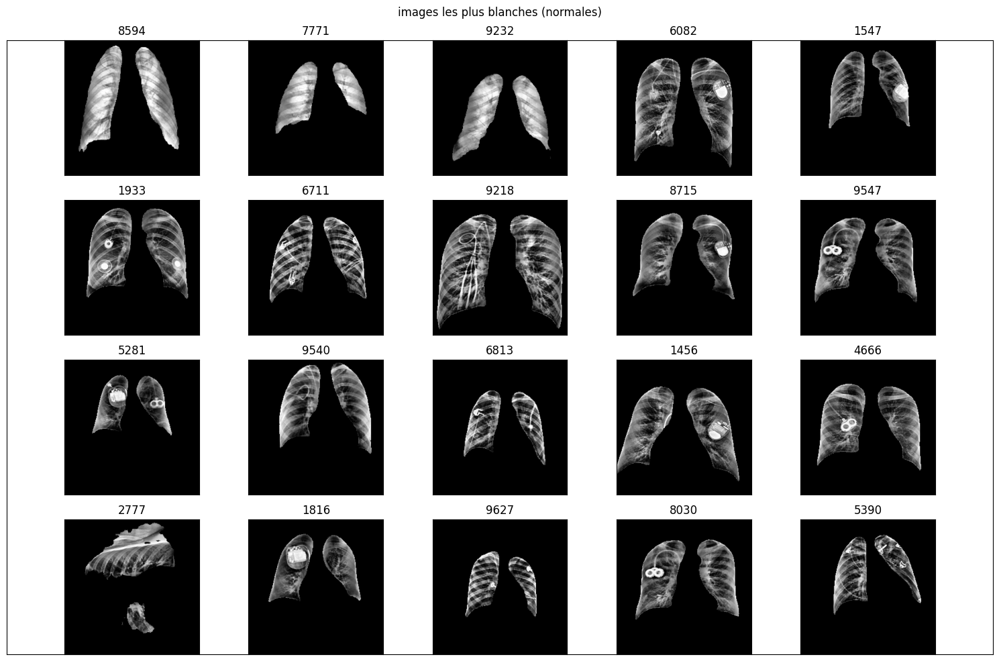

In [135]:
# detection des images ou il y a beaucoup de blanc (normales)

fig =  plt.figure(figsize = (15,10))
plt.suptitle("images les plus blanches (normales)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

white_Normal=[]
for i in range(0, nb_files_Normal):
    
    white_Normal.append(sum(sum(all_img_Normal[:,:,i]>240)))

white_Normal_ids=np.argsort(white_Normal)[-20:][::-1].tolist()

print(white_Normal_ids)
j=1

for i in white_Normal_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[1147, 1538, 1178, 1490, 1212, 311, 1356, 1595, 1155, 1016, 1886, 1832, 1320, 1757, 1826, 1541, 1842, 449, 537, 1850]


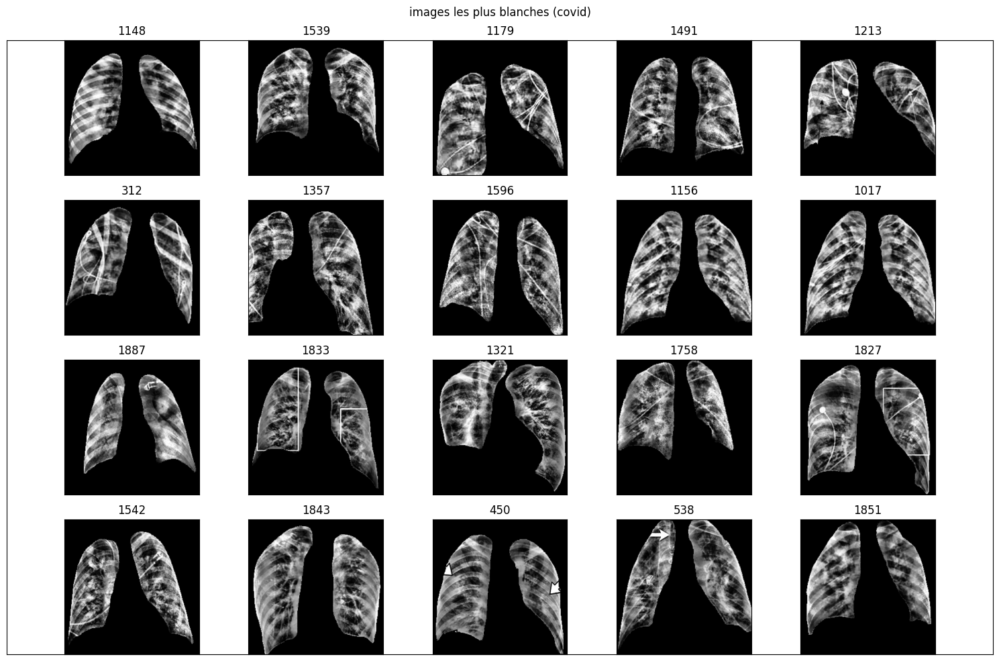

In [136]:
# detection des images ou il y a beaucoup de blanc (covid)

fig =  plt.figure(figsize = (15,10))
plt.suptitle("images les plus blanches (covid)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

white_Covid=[]
for i in range(0, nb_files_Covid):
    
    white_Covid.append(sum(sum(all_img_Covid[:,:,i]>240)))

white_Covid_ids=np.argsort(white_Covid)[-20:][::-1].tolist()

print(white_Covid_ids)
j=1

for i in white_Covid_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[4749, 1241, 765, 3906, 1469, 2992, 134, 5725, 5165, 2190, 2463, 3345, 2563, 3466, 1844, 5033, 920, 187, 2591, 5161]


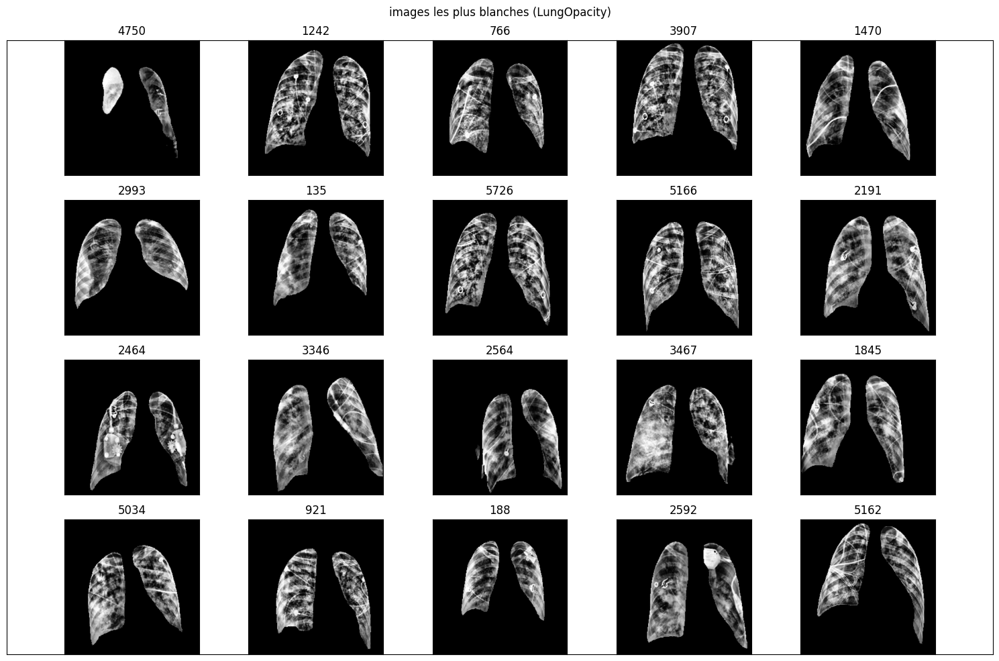

In [137]:
# detection des images ou il y a beaucoup de blanc (LungOpacity)

fig =  plt.figure(figsize = (15,10))
plt.suptitle("images les plus blanches (LungOpacity)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

white_LungOpacity=[]
for i in range(0, nb_files_LungOpacity):
    
    white_LungOpacity.append(sum(sum(all_img_LungOpacity[:,:,i]>240)))

white_LungOpacity_ids=np.argsort(white_LungOpacity)[-20:][::-1].tolist()

print(white_LungOpacity_ids)
j=1

for i in white_LungOpacity_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[494, 1266, 805, 126, 546, 696, 562, 990, 169, 144, 146, 408, 662, 1199, 306, 314, 783, 201, 211, 897]


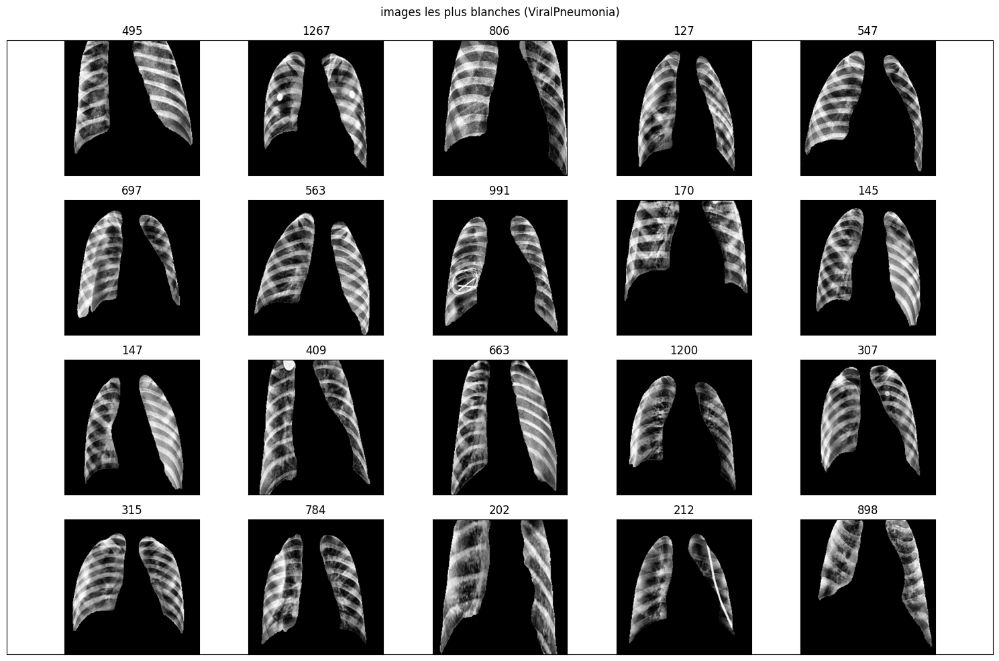

In [138]:
# detection des images ou il y a beaucoup de blanc (ViralPneumonia)

fig =  plt.figure(figsize = (15,10))
plt.suptitle("images les plus blanches (ViralPneumonia)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

white_ViralPneumonia=[]
for i in range(0, nb_files_ViralPneumonia):
    
    white_ViralPneumonia.append(sum(sum(all_img_ViralPneumonia[:,:,i]>240)))

white_ViralPneumonia_ids=np.argsort(white_ViralPneumonia)[-20:][::-1].tolist()

print(white_ViralPneumonia_ids)
j=1

for i in white_ViralPneumonia_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1